In [21]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
import cv2

class ImageSeg:
    # Initializing the path of image and threshold value by taking as class parameters
    def __init__(self, path, threshold):
        self.path = path
        self.img = plt.imread(path)
        
        # Normalize the image if pixel values are between [0, 1]
        if self.img.max() <= 1:
            self.img = (self.img * 255).astype(np.uint8)
        
        self.threshold = threshold

    # Visualize the raw rgb image 
    def visualize_rgb(self):
        rgb_img = self.img
        plt.imshow(rgb_img)
        plt.title("Raw RGB Image")
        plt.show()

    # Nullify the R and B values in the image matrix
    def RGNull(self):
        arr = np.array(self.img)
        for i in range(len(arr)):
            for j in range(len(arr[i])):
                arr[i][j][0] = 0  # Set Red to 0
                arr[i][j][2] = 0  # Set Blue to 0
        return arr 

    # Grayscale the image
    def IsoGray(self):
        RGNull_img = self.RGNull()
        gray_img = cv2.cvtColor(RGNull_img, cv2.COLOR_RGB2GRAY)  # RGB to Grayscale
        return gray_img

    # Apply Adaptive Thresholding using Otsu's method
    def IsoGrayThresh(self):
        gray_img = self.IsoGray()

        # Apply Otsu's thresholding to automatically determine a good threshold
        _, thresh_img = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        plt.imshow(thresh_img, cmap='gray')
        plt.title("Thresholded Image (Otsu's Method)")
        plt.show()
        return thresh_img

    # Visualize raw RGB, Grayscale, and Thresholded images side by side
    def visualize_compare(self):
        fig = plt.figure(figsize=(14, 30))
        rows = 1
        cols = 3

        # Subplot 1: Raw RGB Image
        fig.add_subplot(rows, cols, 1)
        plt.imshow(self.img)
        plt.title("Raw RGB Image")

        # Subplot 2: Grayscale Image
        fig.add_subplot(rows, cols, 2)
        gray_img = self.IsoGray()
        plt.imshow(gray_img, cmap='gray')
        plt.title("Grayscale Image")

        # Subplot 3: Thresholded Image
        fig.add_subplot(rows, cols, 3)
        thresh_img = self.IsoGrayThresh()
        plt.imshow(thresh_img, cmap='gray')
        plt.title("Thresholded Image")

        plt.show()

    # Function to count the non-zero (white) pixels in the thresholded image
    def PixelCount(self):
        count = 0
        arr = self.IsoGrayThresh()

        # Count non-zero pixels (i.e., white pixels) in the thresholded image
        for i in arr:
            for j in i:
                if j != 0:
                    count += 1
        return count

    # Visualize the histogram of grayscale image to help with threshold selection
    def visualize_histogram(self):
        gray_img = self.IsoGray()
        plt.hist(gray_img.ravel(), bins=256, range=[0, 256])
        plt.title("Intensity Histogram")
        plt.xlabel("Pixel Intensity")
        plt.ylabel("Frequency")
        plt.show()


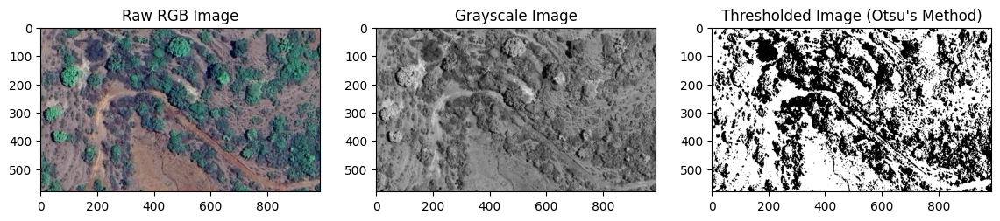

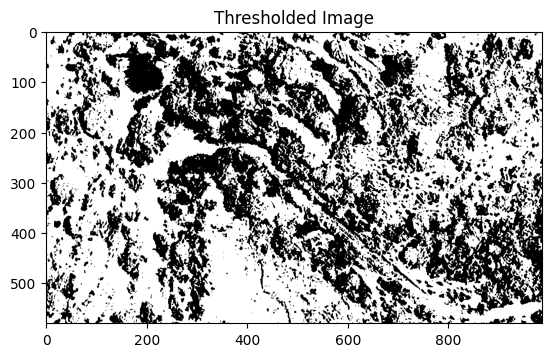

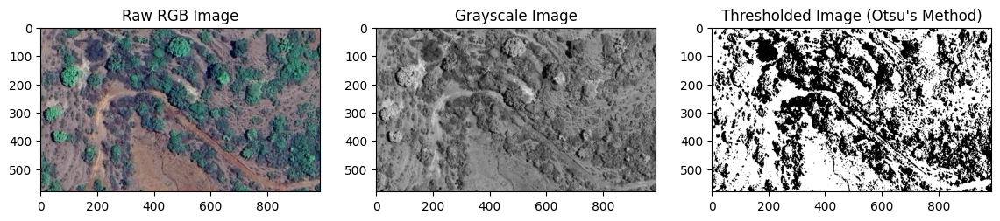

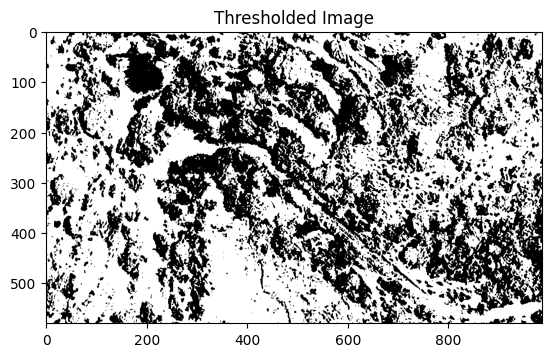

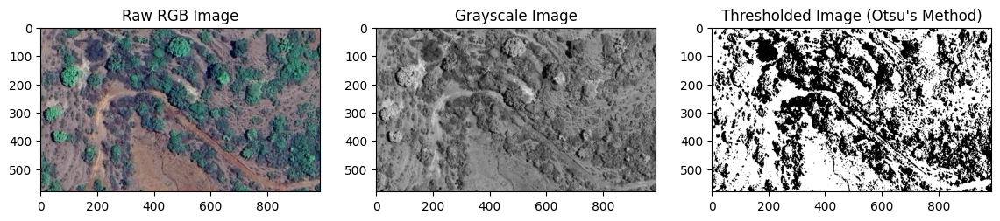

...

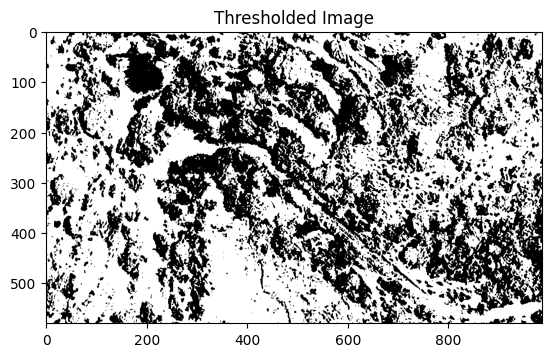

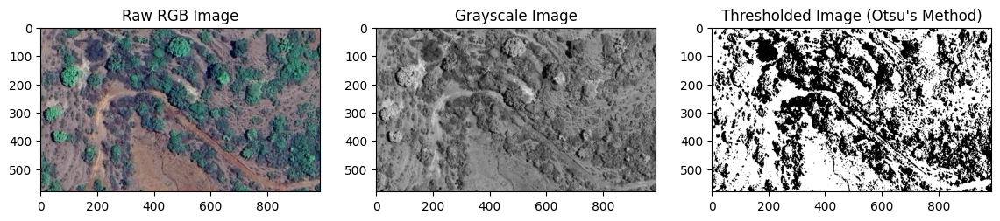

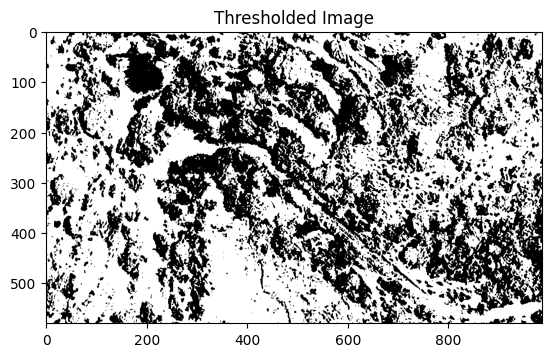

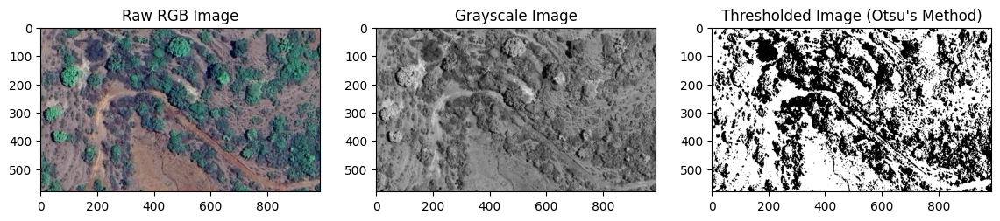

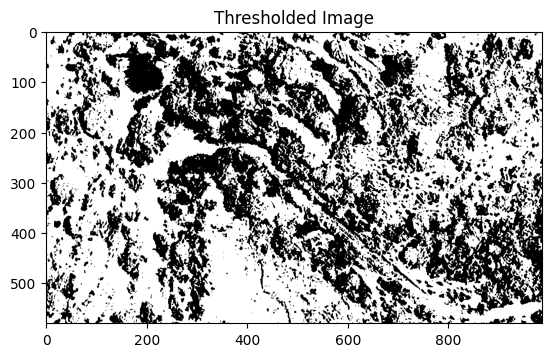

In [22]:
thresh = 0 
while thresh<100:
    thresh+=5
    obj = ImageSeg(r"C:\Users\Tanmay Patil\Desktop\sampletree1.png",thresh)
    obj.visualize_compare()


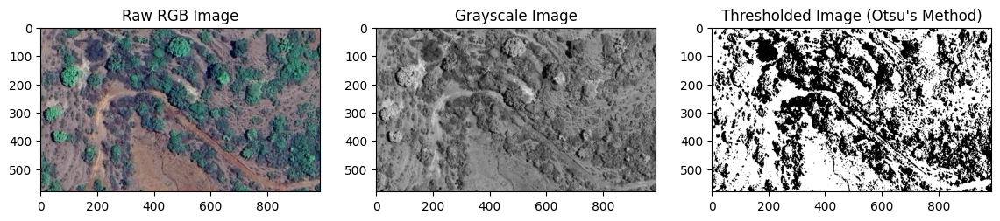

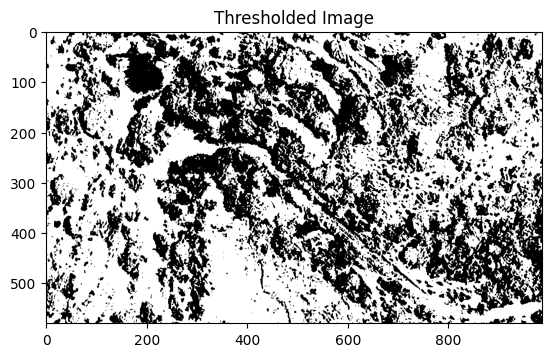

In [23]:
obj.visualize_compare()

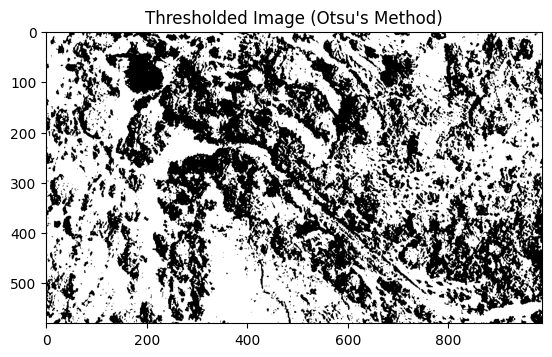

Tree Pixels -> 344188 pixels


In [24]:
print(f"Tree Pixels -> {obj.PixelCount()} pixels")